<a href="https://colab.research.google.com/github/bettytom/major-projects/blob/main/Group_Scienticists.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Importing Relevant Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Connecting to Google Drive
from google.colab import drive
drive.mount('/content/drive')




In [ ]:
# Reading out data file from google drive
df = pd.read_csv('/content/drive/My Drive/Colab Notebooks/Data Sets/bank-additional-full.csv', sep=';')

In [ ]:
df.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

* Our data does not appear to have any missing values

In [ ]:
df.duplicated().sum()

12

* We have 12 duplicated rows.

In [ ]:
df[df.duplicated(keep=False)]

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
1265,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,124,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
1266,39,blue-collar,married,basic.6y,no,no,no,telephone,may,thu,124,1,999,0,nonexistent,1.1,93.994,-36.4,4.855,5191.0,no
12260,36,retired,married,unknown,no,no,no,telephone,jul,thu,88,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
12261,36,retired,married,unknown,no,no,no,telephone,jul,thu,88,1,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
14155,27,technician,single,professional.course,no,no,no,cellular,jul,mon,331,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
14234,27,technician,single,professional.course,no,no,no,cellular,jul,mon,331,2,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16819,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,43,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
16956,47,technician,divorced,high.school,no,yes,no,cellular,jul,thu,43,3,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
18464,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,128,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no
18465,32,technician,single,professional.course,no,yes,no,cellular,jul,thu,128,1,999,0,nonexistent,1.4,93.918,-42.7,4.968,5228.1,no


* Visual inspection of our duplictes

In [ ]:
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


age


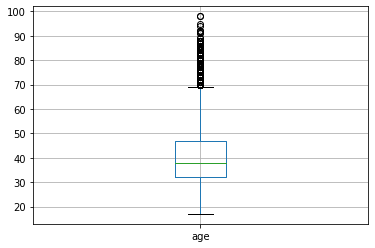


duration


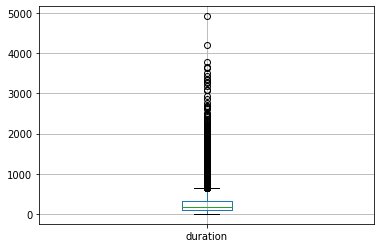


campaign


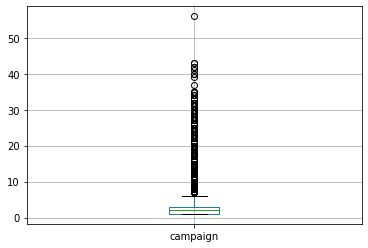


pdays


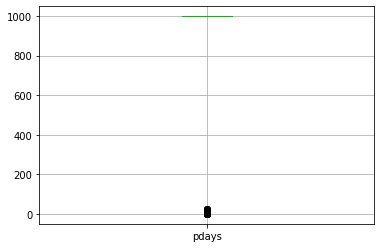


previous


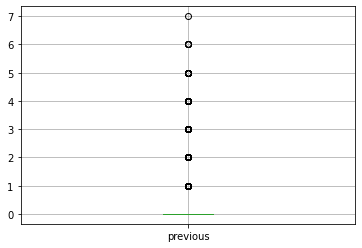


emp.var.rate


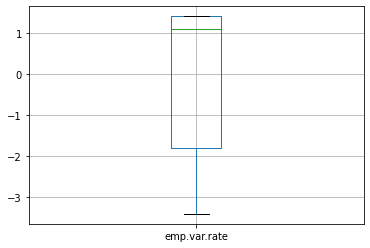


cons.price.idx


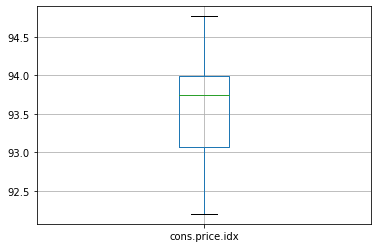


cons.conf.idx


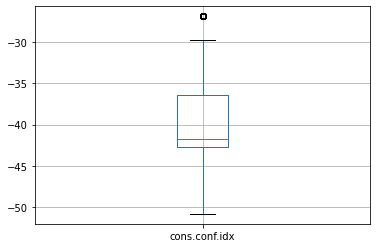


euribor3m


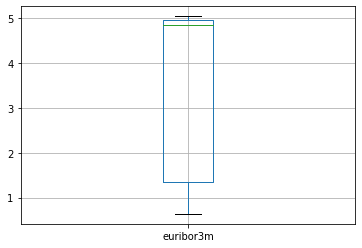


nr.employed


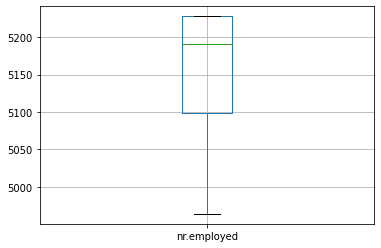

In [ ]:
num_cols = list(df.describe().columns)

%matplotlib inline
for c in num_cols:
  print(c)
  df.boxplot(column=[c])
  plt.show()
  print()

* Age: We can see that for age, we have a range from late teens to late sixties, with outliers above that all the way upto the age of 100. However as this is with reason, these outliers don't need to be removed.

* for the call duration, we have a range of calls from 0 seconds all the way upto 700+ seconds for the majority of calls, with some outliers going all the way upto 5000 seconds. It should be noted however that while there is a very strong correlation between the length of the call and the final outcome, this specific feature corellation does not imply causation as a call with 0 seconds obviously implies 'no' and the result of any other call will be known during the call. - so this feature should not be used to build out model.

* campaign: We can see that the majority of people were contacted between 1 and 7 times, however we have a good number of outliers for this features, with the data indicating that some people were contacted almost 60 times. This may not seem realistic.

* pdays: most readings are at 999, which indicates that majority of clients were not contacted before(according to the data dictionary privided with the dataset). Due to the way this data is represented, with 999 indicating no previous attempt to contact, we may not be able to use this data or we may need to change it into a different form.

* previous: We can see that the majority of clients in this dataset were not contacted for other campaigns, while we have a sizable number of clients being contacted anywhere between 1 and 7 times for previous campaigns.

* Employment Variation Rate: This measures the employment variation rate for this cliennt. It varies from -3.5 to 1.5

* Consumer price index: This seems to be an indicator of the consumer price index and varies from around 92 to 95

* Consumer confidence index: this varies from -51 to -29 with a few outliers at roughly -26.

* Euribor 3 month rate varies between 0.5 and 5

* Number of employees- which varies between 4930 and 5240.

In [ ]:
(df.y.value_counts()/41188)*100

no     88.734583
yes    11.265417
Name: y, dtype: float64

* It seems that for our target column we have imbalanced data with 88.7% of the results being a 'no' and an 11.2% of the results being 'yes'

In [ ]:
obj_cols = list(df.select_dtypes(include='object').columns)

print(obj_cols)
print()

for c in obj_cols:
  print(c)
  print(((df[c].value_counts()/41188)*100).round(2))
  print()

['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'poutcome', 'y']

job
admin.           25.30
blue-collar      22.47
technician       16.37
services          9.64
management        7.10
retired           4.18
entrepreneur      3.54
self-employed     3.45
housemaid         2.57
unemployed        2.46
student           2.12
unknown           0.80
Name: job, dtype: float64

marital
married     60.52
single      28.09
divorced    11.20
unknown      0.19
Name: marital, dtype: float64

education
university.degree      29.54
high.school            23.10
basic.9y               14.68
professional.course    12.73
basic.4y               10.14
basic.6y                5.56
unknown                 4.20
illiterate              0.04
Name: education, dtype: float64

default
no         79.12
unknown    20.87
yes         0.01
Name: default, dtype: float64

housing
yes        52.38
no         45.21
unknown     2.40
Name: housing, dtype: float64

loan
no     

### Data distribution -checking for skewness

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


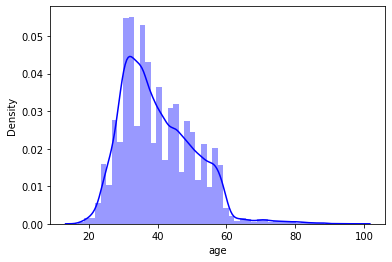

In [ ]:
sns.distplot(df['age'],color="blue",hist=True);

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


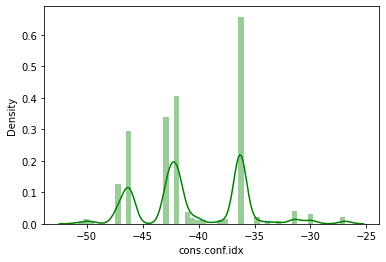

In [ ]:
sns.distplot(df['cons.conf.idx'],color="green",hist=True);

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


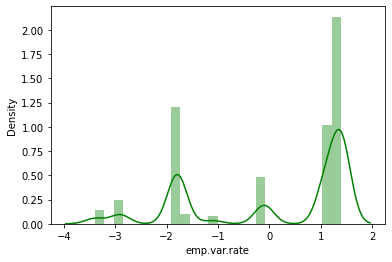

In [ ]:
sns.distplot(df['emp.var.rate'],color="green",hist=True);

Data Profile report

In [ ]:
from pandas_profiling import ProfileReport
report=ProfileReport(df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Changing the target column to 0s & 1s

Solving imbalance problem using hybrid solution between under-sampling and over-sampling

#### Hypotheses
- How many customers were able to be targeted as a success in the last campaign
- What months have targeted the highest numbers of customers and why
- Do customers who have credit fail usually take part in the campaigns
- What is the targeted age and what age should be potentially targeted
- Do customers who have a loan in the bank contacted for the campaign
- Are the success in call rate linked to the CPI and CCI of different months like May
- Why do some days have higher outreach than others

Deductions based on the data report
- Many people have not acquired loans over time
- There have been few successes with the previous campaigns
- Most responses have happened on thursday
-  The month of May had recorded the highest outreach

Data cleansing

Mapping all basic education to be basic only

In [ ]:
df["education"].replace({"basic.4y": "basic", "basic.6y": "basic","basic.9y":"basic"}, inplace=True)

Mapping age to groups

In [ ]:
def age_to_categorical(data1,age):
    age_group=pd.cut(age,bins=[10,20,30,40,50,60,70,80,90,100],labels=['10-19','20-29','30-39','40-49','50-59','60-69','70-79','80-89','90-100'])
    #inserting the age group after age and deleting it
    data1.insert(1,'age_group',age_group)
    #dropping age column
    data1.drop('age',axis=1,inplace=True)
    
    return data1
df=age_to_categorical(df,df.age)
df

,age_group,job,marital,education,default,housing,loan,contact,month,day_of_week,duration,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,50-59,housemaid,married,basic,no,no,no,telephone,may,mon,261,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,50-59,services,married,high.school,unknown,no,no,telephone,may,mon,149,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,30-39,services,married,high.school,no,yes,no,telephone,may,mon,226,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,30-39,admin.,married,basic,no,no,no,telephone,may,mon,151,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,50-59,services,married,high.school,no,no,yes,telephone,may,mon,307,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,70-79,retired,married,professional.course,no,yes,no,cellular,nov,fri,334,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes
41184,40-49,blue-collar,married,professional.course,no,no,no,cellular,nov,fri,383,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41185,50-59,retired,married,university.degree,no,yes,no,cellular,nov,fri,189,2,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,no
41186,40-49,technician,married,professional.course,no,no,no,cellular,nov,fri,442,1,999,0,nonexistent,-1.1,94.767,-50.8,1.028,4963.6,yes


Mapping number of campaigns into groups

In [ ]:
def campaign_groups(data2,campaign):
    campaign_group=pd.cut(campaign,bins=6,labels=['1-10','11-20','21-30','31-40','41-50','51-60'])
    #inserting the age group after age and deleting it
    data2.insert(12,'campaign_group',campaign_group)
    
    return data2
df=campaign_groups(df,df.campaign)

EDA

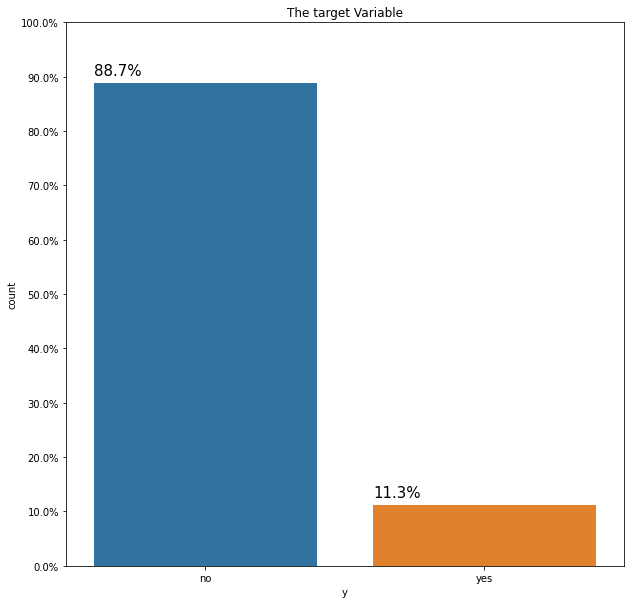

In [ ]:
figure(figsize=(10,10))
total=len(df['y'])
plot=sns.countplot(x=df['y'],data=df)
for p in plot.patches:
    plot.annotate('{:.1f}%'.format(100*p.get_height()/total), (p.get_x(), p.get_height()),size=15,xytext=(0,8),textcoords='offset points')
plot.yaxis.set_ticks(np.linspace(0, total, 11))
plot.set_yticklabels(map('{:.1f}%'.format, 100*plot.yaxis.get_majorticklocs()/total))
plot.set_title("The target Variable")
plt.show()

This plot shows th imbalance of the data

In [ ]:
def countplot_columns(columns):
    plt.figure(figsize=(15,10))
    plot=sns.countplot(x=columns,data=df)
    total=len(df['y'])
    
    for p in plot.patches:
        
        plot.annotate('{:.1f}%'.format(100*p.get_height()/total), (p.get_x(), p.get_height()),size=15,xytext=(0,8),textcoords='offset points')
    plot.yaxis.set_ticks(np.linspace(0, total, 11))
    plot.set_yticklabels(map('{:.1f}%'.format, 100*plot.yaxis.get_majorticklocs()/total))
    plt.show()

def countplot_target_varaible(columns,classes):
    plt.figure(figsize=(15,10))
    total=len(df[classes])
    plot=sns.countplot(x=columns,data=df,hue=classes)
    for p in plot.patches:
        plot.annotate('{:.1f}%'.format(100*p.get_height()/total), (p.get_x(), p.get_height()),size=15,xytext=(0,8),textcoords='offset points')
    plot.yaxis.set_ticks(np.linspace(0, total, 11))
    plot.set_yticklabels(map('{:.1f}%'.format, 100*plot.yaxis.get_majorticklocs()/total))
    plt.show()

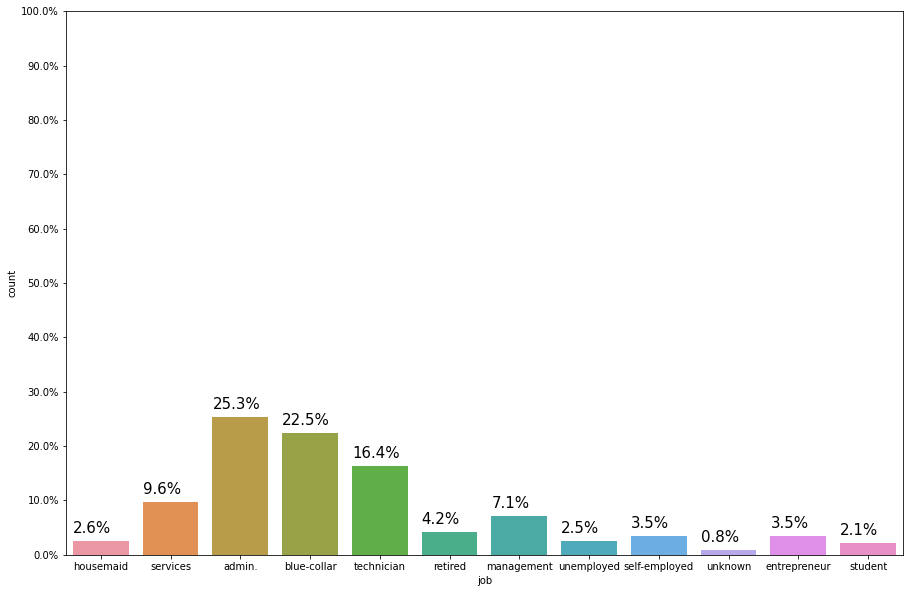

In [ ]:
countplot_columns('job')

Admin, blue-colar and technicians were the most people contacted.

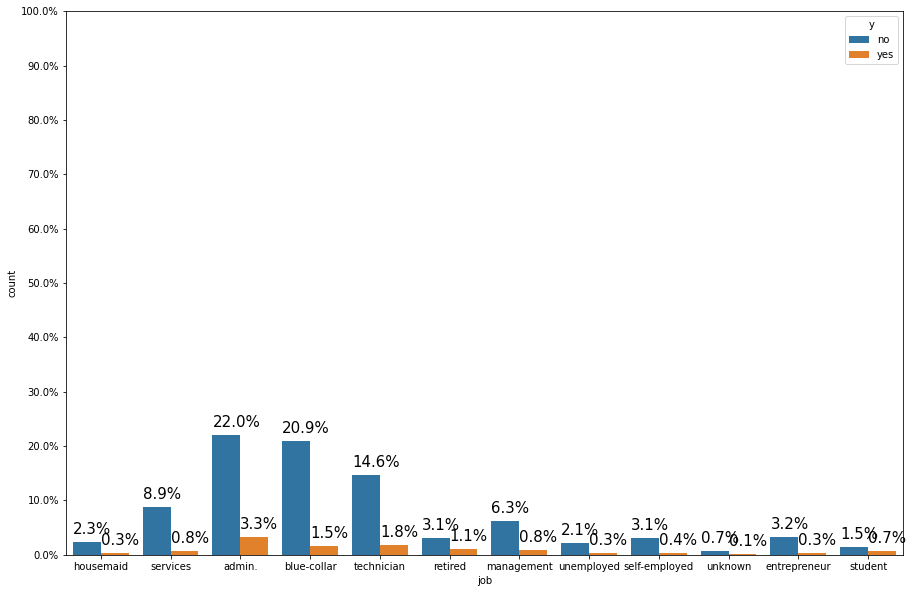

In [ ]:
countplot_target_varaible('job','y')

Percantage of accepting the offer for each professional 

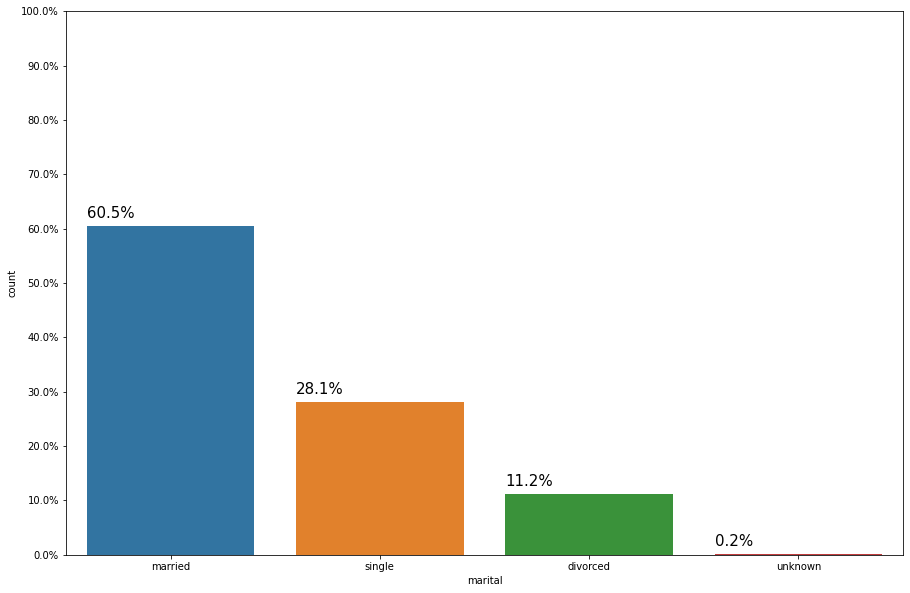

In [ ]:
countplot_columns('marital')

Most of the clients were married

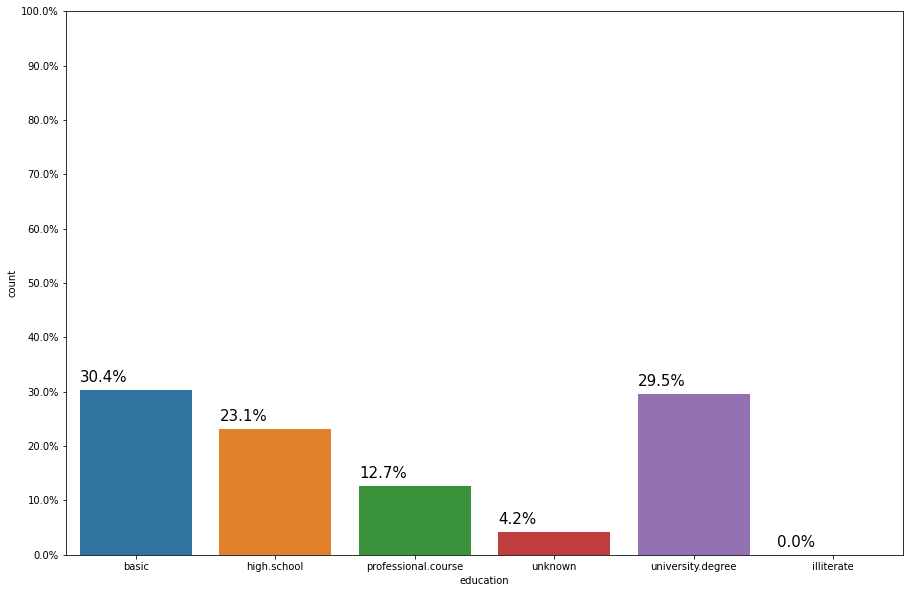

In [ ]:
countplot_columns("education")

University graduates and basic education were the most contacted people

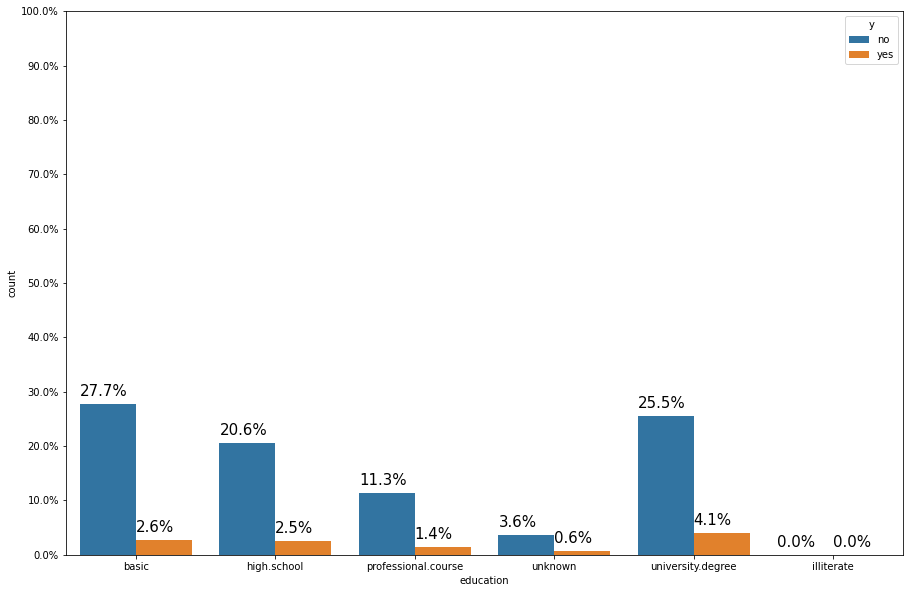

In [ ]:
countplot_target_varaible("education","y")

University graduates were the most people accepting the offer

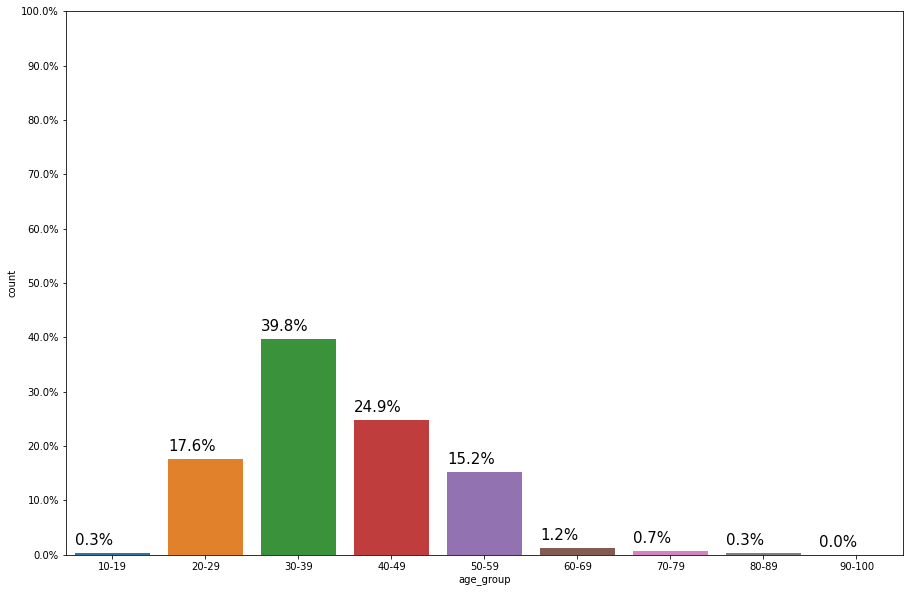

In [ ]:
countplot_columns("age_group")

30-39 age group were the most targeted category

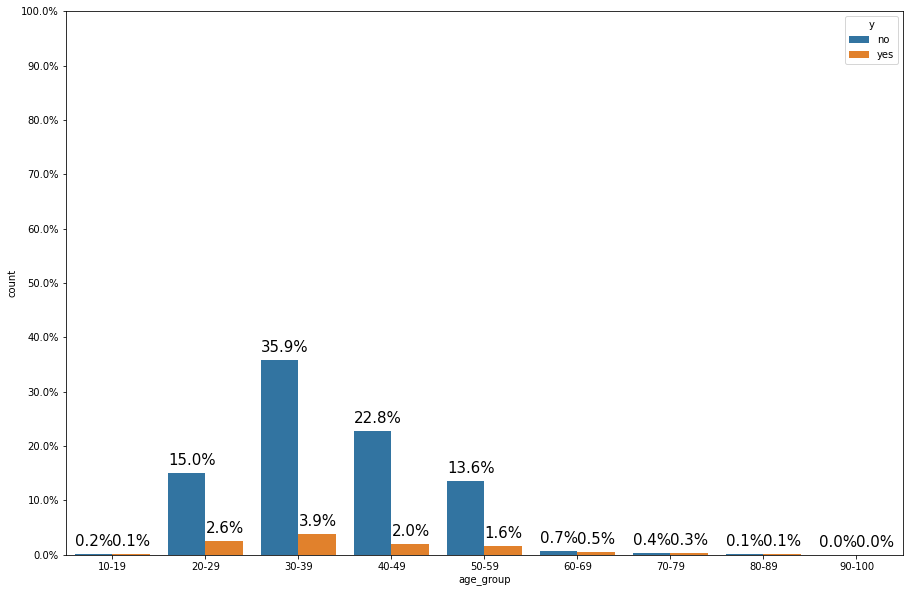

In [ ]:
countplot_target_varaible("age_group","y")

Although 40-49 group were contacted more, yet 30-39 group subscribed more

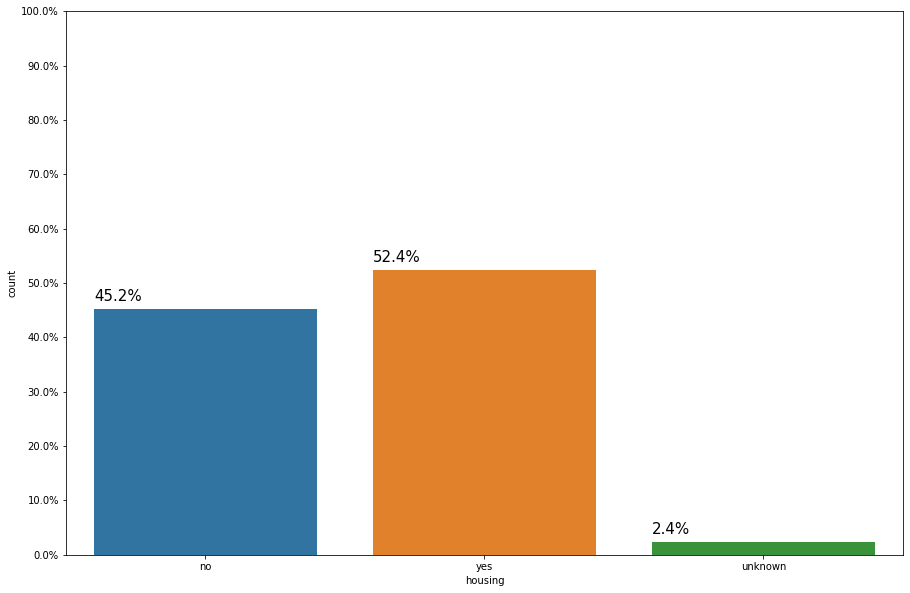

In [ ]:
countplot_columns("housing")

People with houses  were contacted more than others

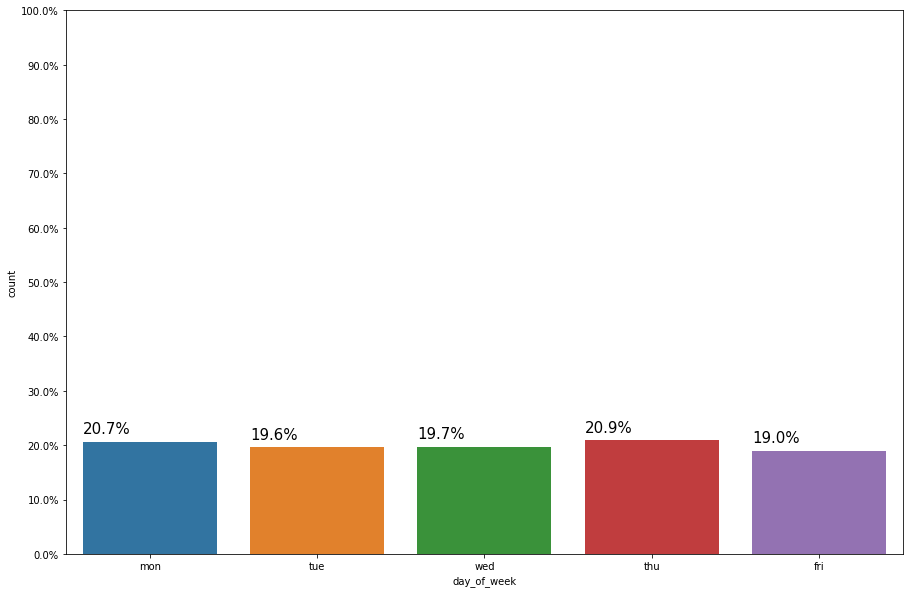

In [ ]:
countplot_columns("day_of_week")

No contacts were made on weekends and contacts were mostly equal through the working days

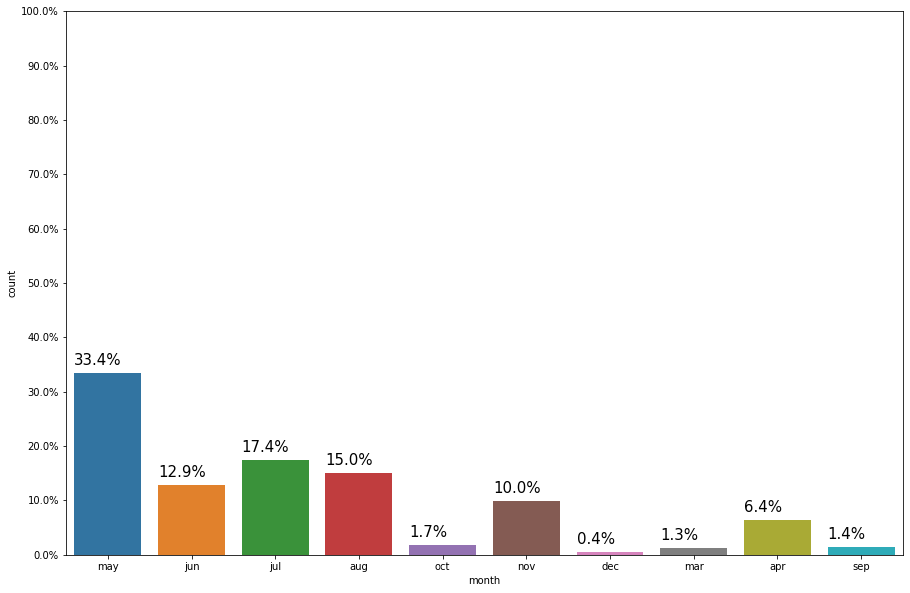

In [ ]:
countplot_columns("month")

Summer was more crowded than rest of the year

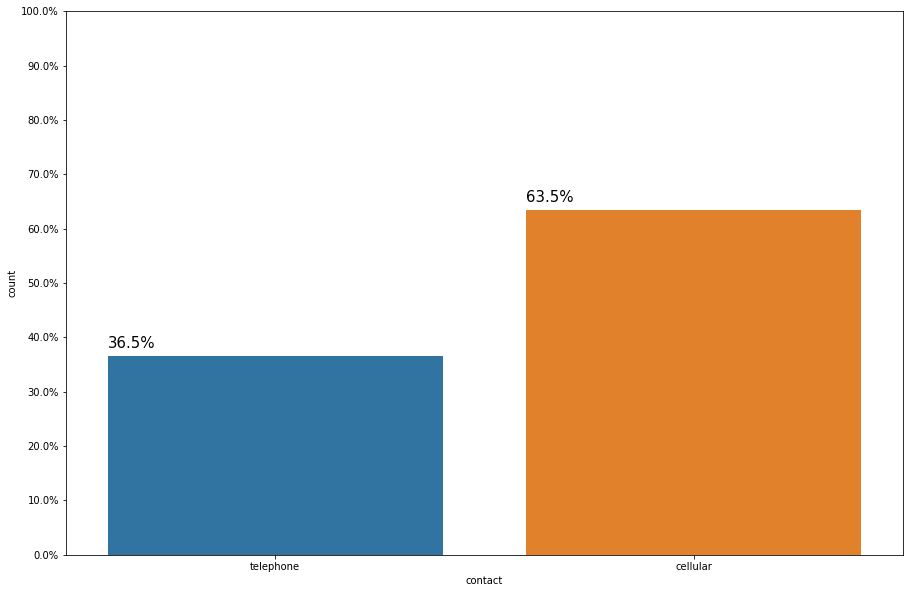

In [ ]:
countplot_columns("contact")

Contatc was through cellular more than telephone

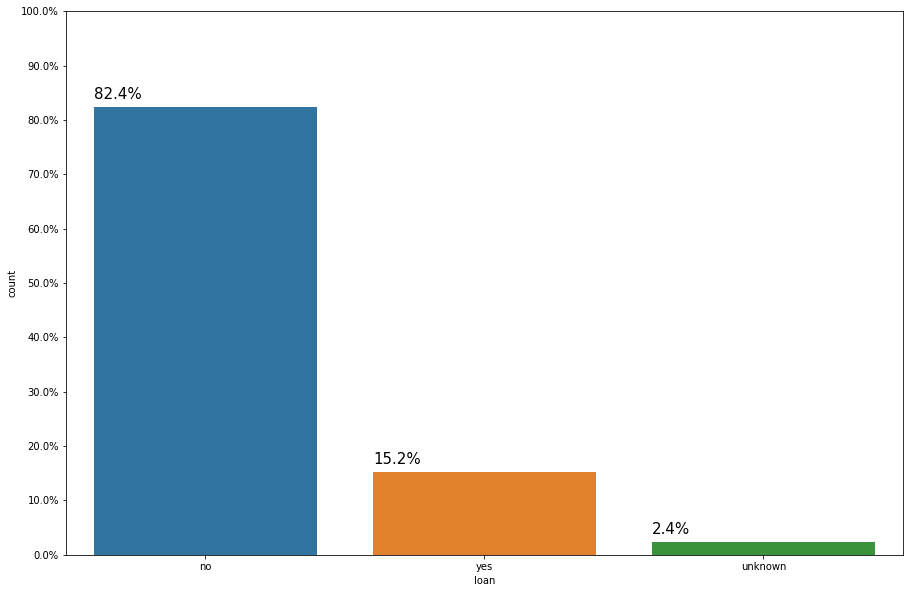

In [ ]:
countplot_columns('loan')

People without loans were contacted more since they do not have bank commitments

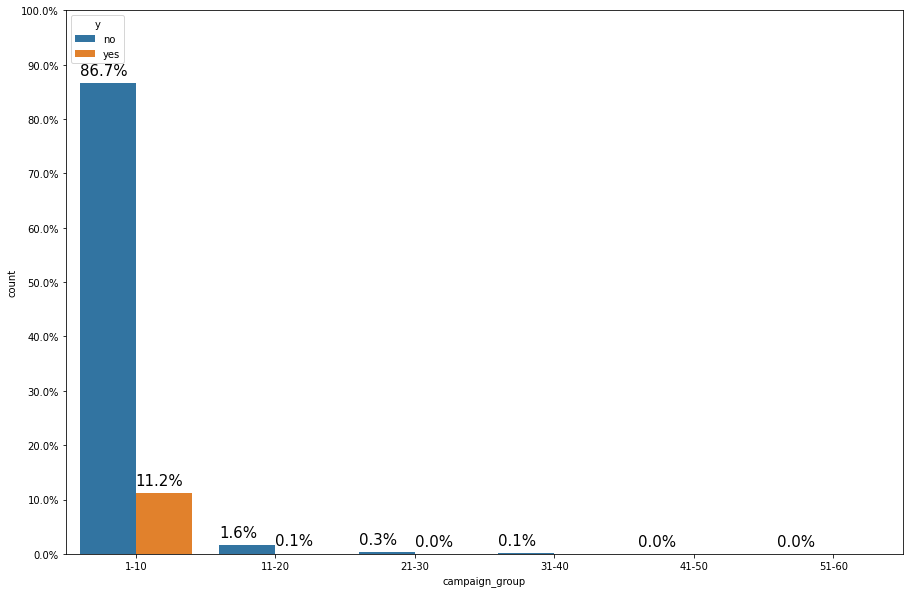

In [ ]:
countplot_target_varaible("campaign_group","y")

Most customers were contacted between 1 and 10 times and 11.2% subscribed during the campaigns

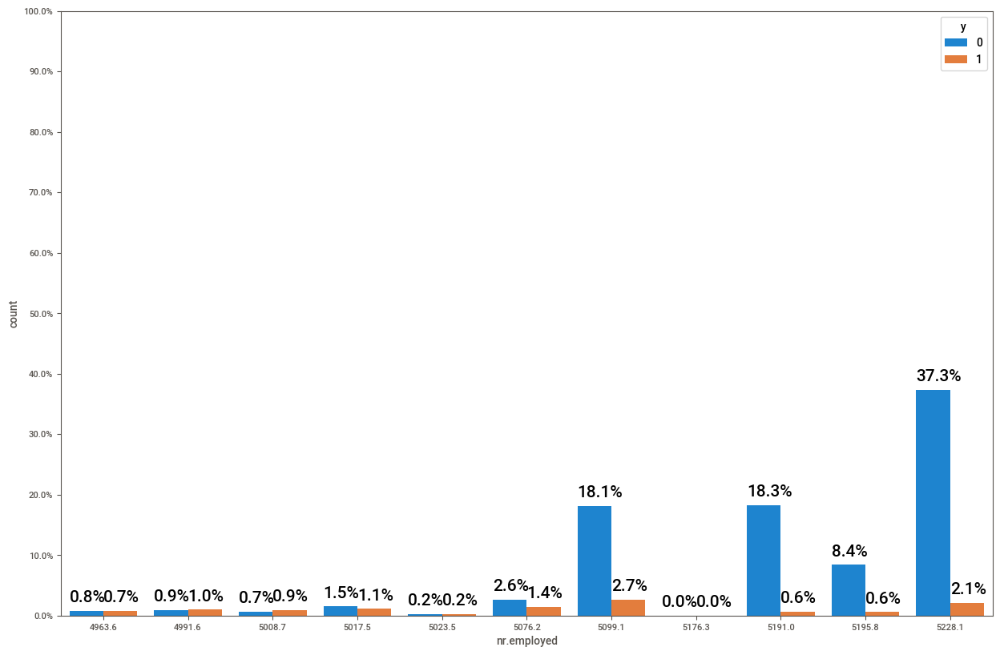

In [ ]:
countplot_target_varaible("nr.employed","y")

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


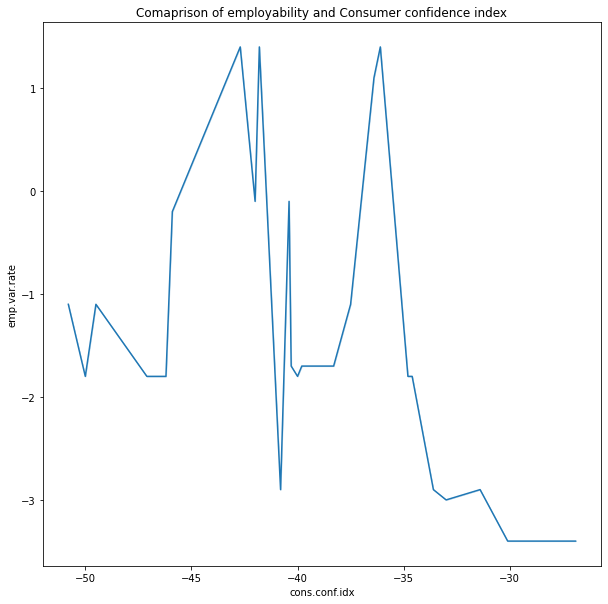

In [ ]:
fig=plt.figure(figsize=(10,10))
plt.title('Comaprison of employability and Consumer confidence index')
sns.lineplot('cons.conf.idx','emp.var.rate', data =df,palette='inferno')

There is an immediate increase and decrease of how customers are likely to spend, that is particularly for the term deposit,those who do not have a stable source of income are likely not to take the offer unlike those who have a stbale income.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


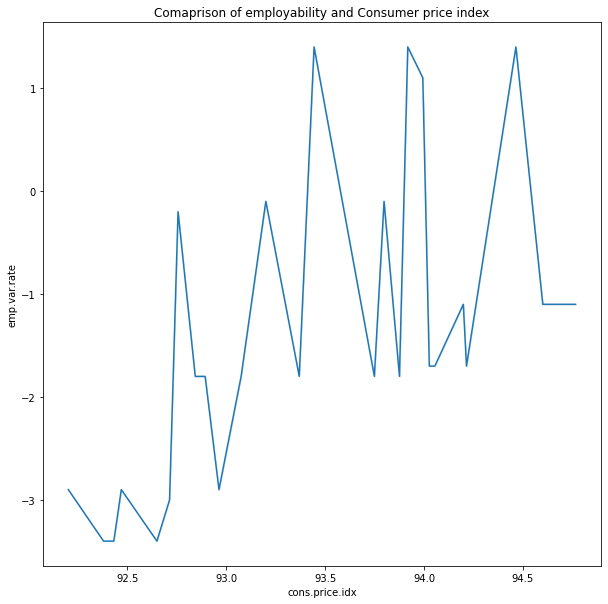

In [ ]:
fig=plt.figure(figsize=(10,10))
plt.title('Comaprison of employability and Consumer price index')
sns.lineplot('cons.price.idx','emp.var.rate', data =df)

An index of 110 means that there's been a 10% rise in the price of the market basket and 90% indicates a 10% decrease in the price of the market basket.There seems to be a positive correlation between the two variables

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


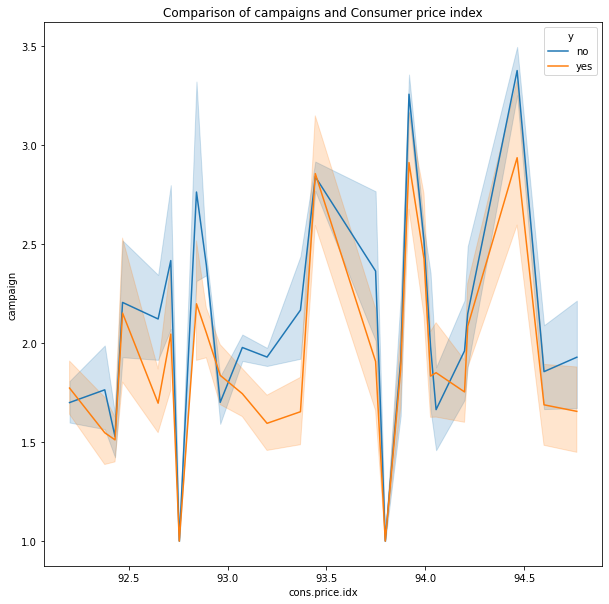

In [ ]:
fig=plt.figure(figsize=(10,10))
plt.title('Comparison of campaigns and Consumer price index')
sns.lineplot('cons.price.idx','campaign', data =df, hue='y')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


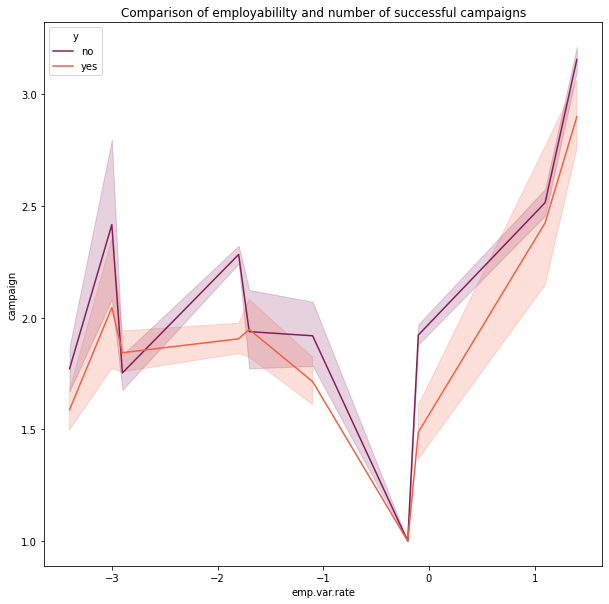

In [ ]:
fig=plt.figure(figsize=(10,10))
plt.title('Comparison of employabililty and number of successful campaigns')
sns.lineplot('emp.var.rate','campaign', data =df, hue='y',palette='rocket')

We can clearly say that when the employability rate was at a zero(not many people having jobs) the number of successful campaigns were low. However when the rate changes to 1 which is a positive rate the customers subscribing to the term deposit are high.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


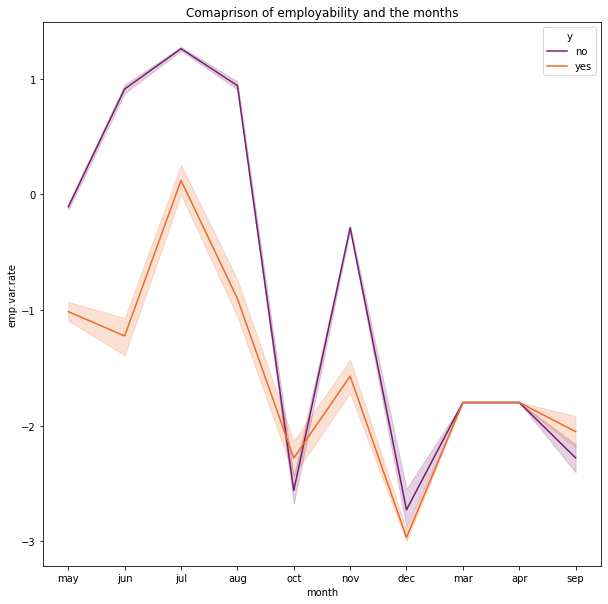

In [ ]:
fig=plt.figure(figsize=(10,10))
plt.title('Comaprison of employability and the months')
sns.lineplot('month','emp.var.rate', data =df, hue='y',palette='inferno')

There was a stagnancy in March and April of those who took the term deposit. December had the lowest rate of employability and majority did not take the term deposit. However betwwen May and July the numbers were quite high with July being the highest peak for the people who took the term deposit but it can still be noted that although the three months were good for the customers majority did not subscribe for a term deposit.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


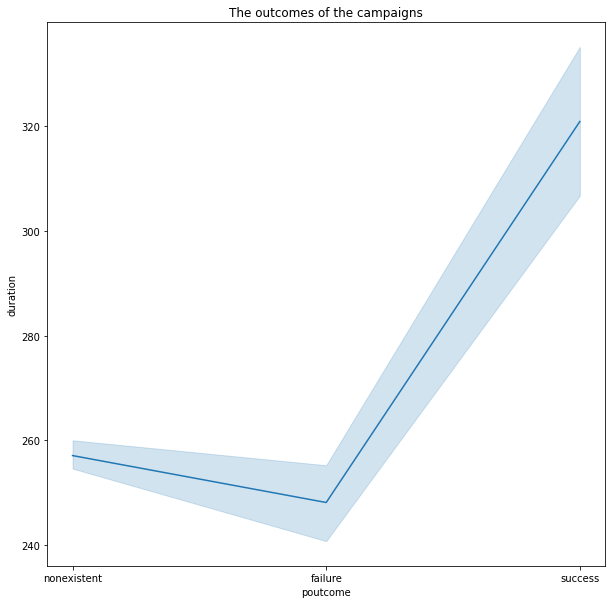

In [ ]:
fig=plt.figure(figsize=(10,10))
plt.title('The outcomes of the campaigns')
sns.lineplot('poutcome','duration', data =df)
 

The campaigns that were successful were the ones that had a long call duration

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


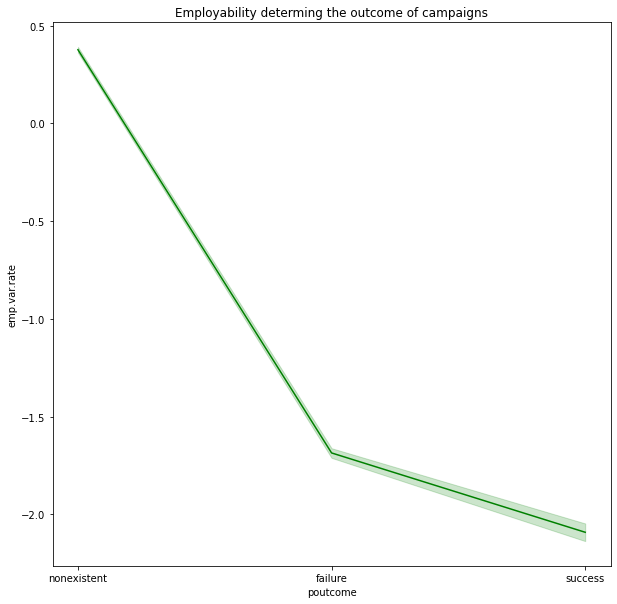

In [ ]:
fig=plt.figure(figsize=(10,10))
plt.title('Employability determing the outcome of campaigns')
sns.lineplot('poutcome','emp.var.rate', data =df,color='green')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


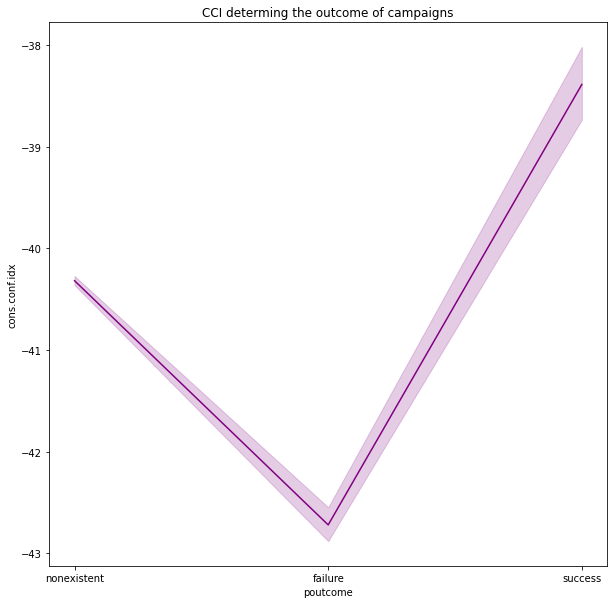

In [ ]:
fig=plt.figure(figsize=(10,10))
plt.title('CCI determing the outcome of campaigns')
sns.lineplot('poutcome','cons.conf.idx', data =df,color='purple')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


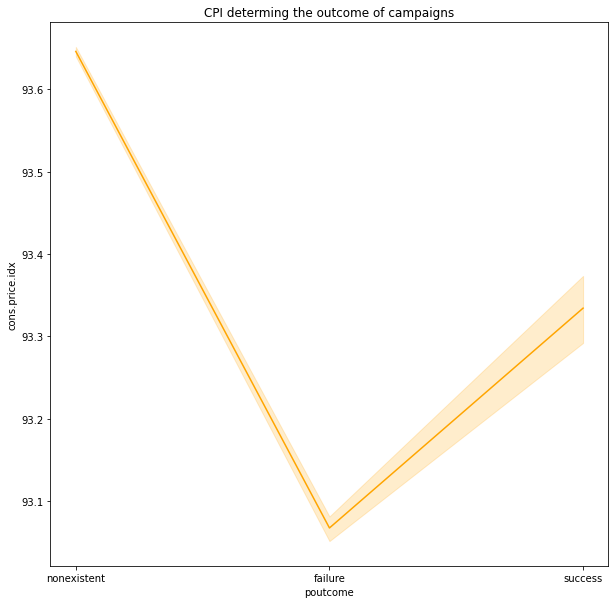

In [ ]:
fig=plt.figure(figsize=(10,10))
plt.title('CPI determing the outcome of campaigns')
sns.lineplot('poutcome','cons.price.idx', data =df,color='orange')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


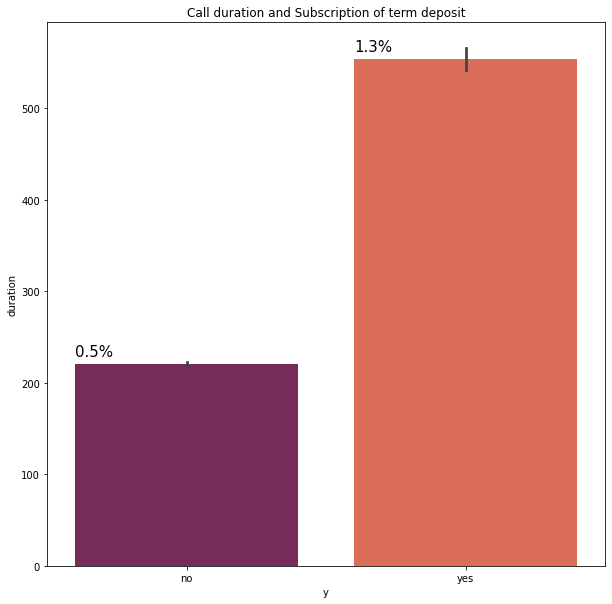

In [ ]:
yes=len(df['y'])
fig=plt.figure(figsize=(10,10))
plot=sns.barplot('y','duration', data =df,palette='rocket')
for y in plot.patches:
  plt.title('Call duration and Subscription of term deposit')
  plot.annotate('{:.1f}%'.format(100*y.get_height()/yes),(y.get_x(),y.get_height()),size=15, xytext=(0,8),textcoords='offset points')

A long call duration has been a factor to influence those who had subscribed for a term deposit , this is accounted by 1.3%

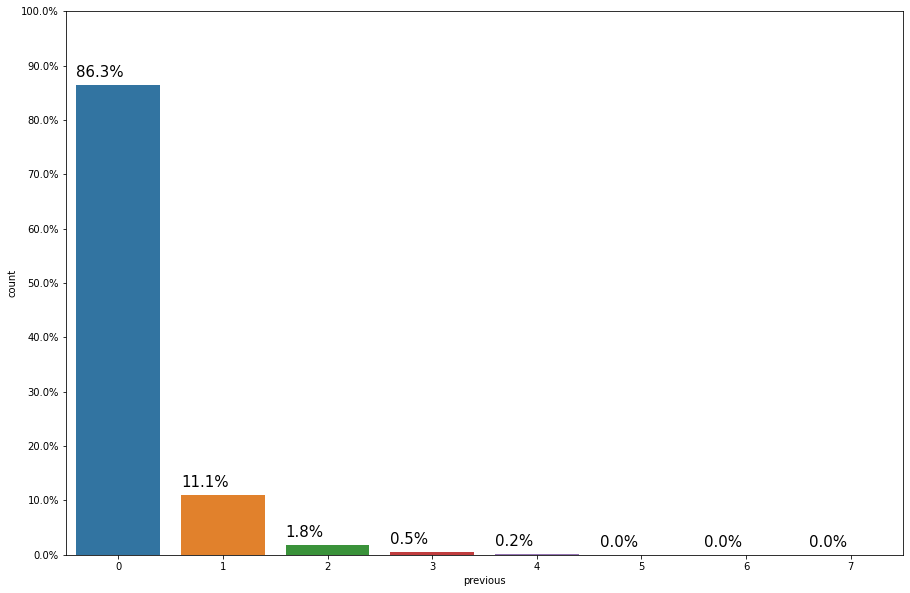

In [ ]:
countplot_columns('previous')

Many customers who  had never been contacted actually are the highest.

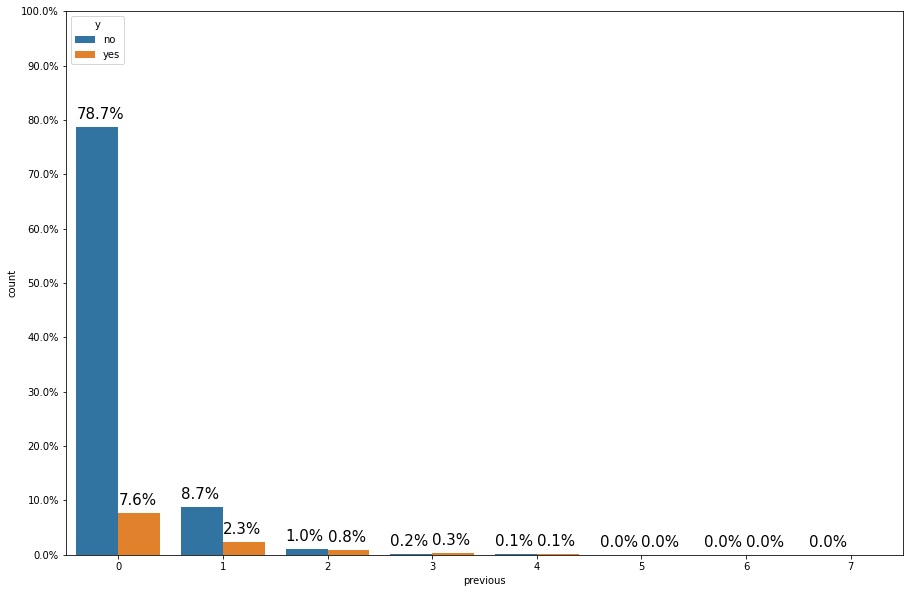

In [ ]:
countplot_target_varaible("previous","y")

New customers were mostly targeted and had the highest rate of accepting the term deposit

##Feature Engineering

In [ ]:
from sklearn.preprocessing import LabelEncoder
encod=LabelEncoder()
df['housing']=encod.fit_transform(df['housing'])
df['loan']=encod.fit_transform(df['loan'])
df['day_of_week']=encod.fit_transform(df['day_of_week'])
df['marital']=encod.fit_transform(df['marital'])
df['y']=encod.fit_transform(df['y'])
df['month']=encod.fit_transform(df['month'])
df['poutcome']=encod.fit_transform(df['poutcome'])
df['education']=encod.fit_transform(df['education'])

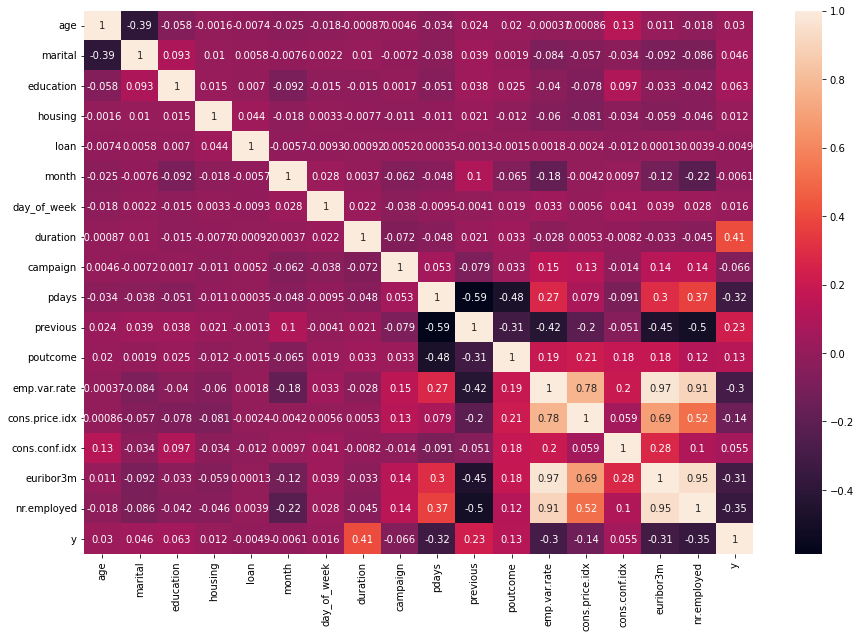

In [ ]:
correlation=df.corr()
fig=plt.figure(figsize=(15,10))
        
        
sns.heatmap(correlation, annot=True)

Fearures highly correlated with the target variable

In [ ]:
!pip3 install --upgrade sweetviz
import sweetviz as sv

     |████████████████████████████████| 15.1 MB 23.2 MB/s 


                                             |          | [  0%]   00:00 -> (? left)


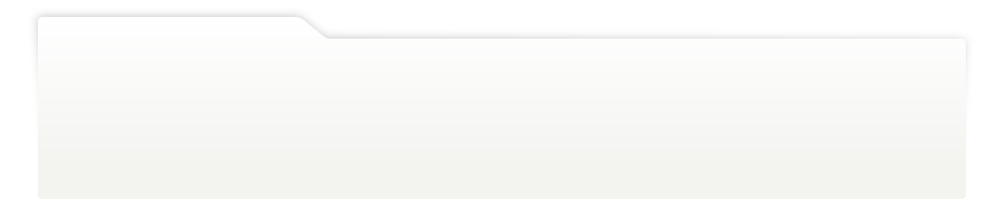
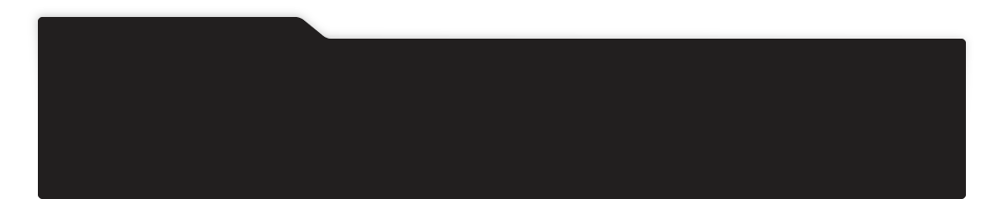
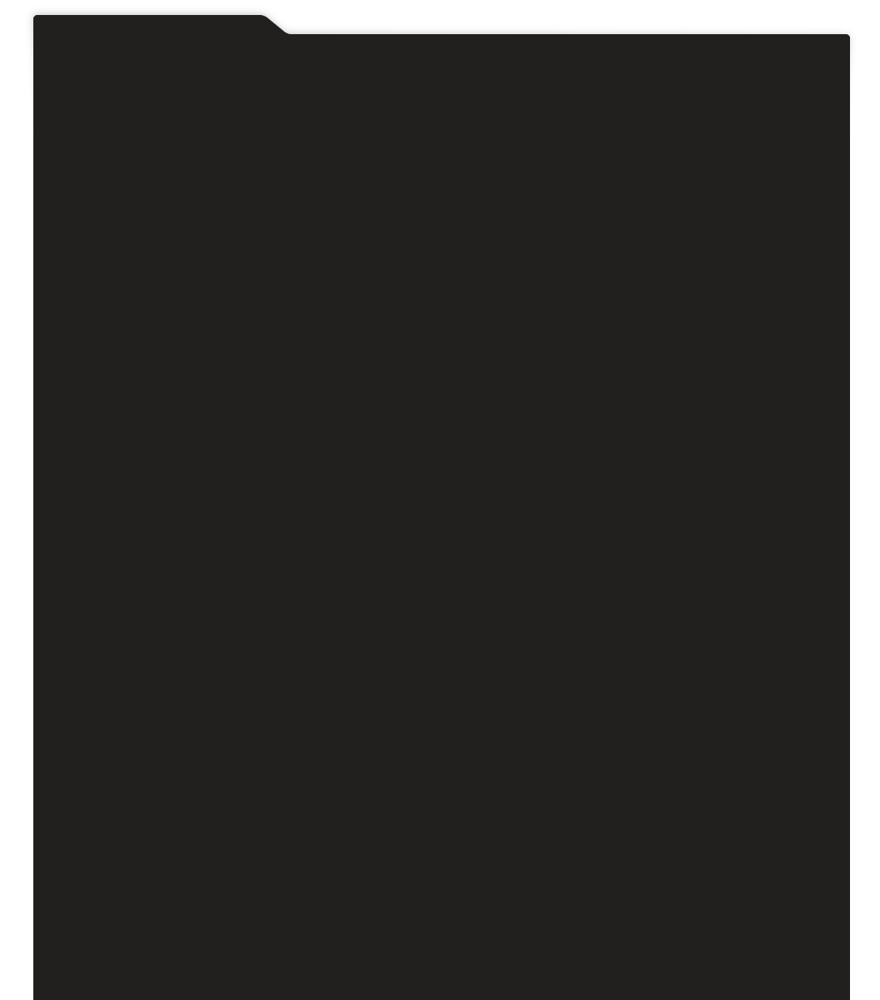
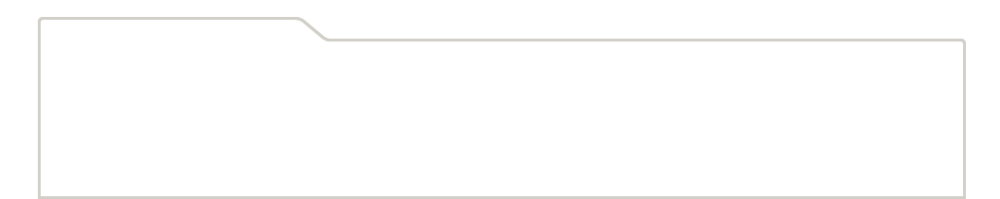
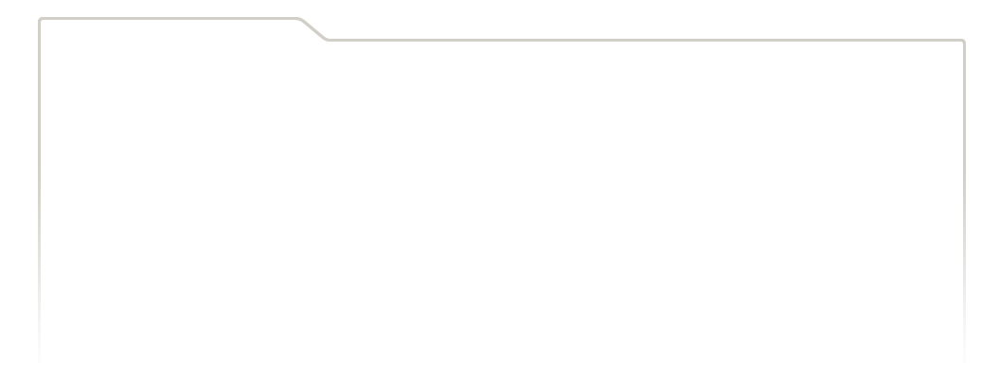
...
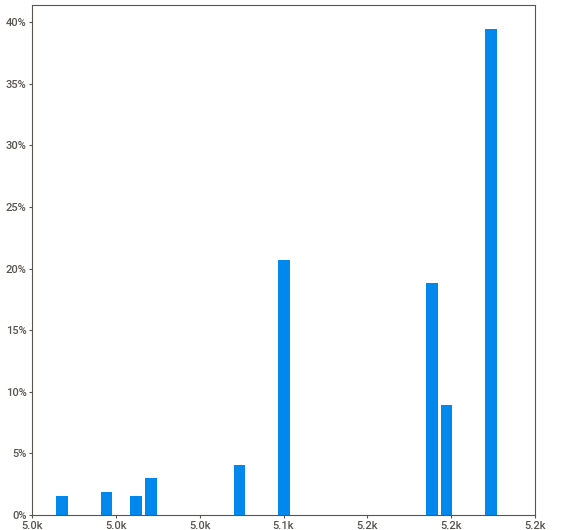
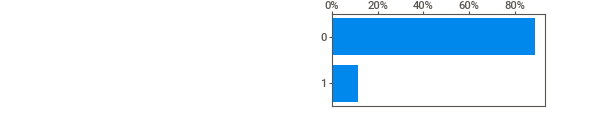
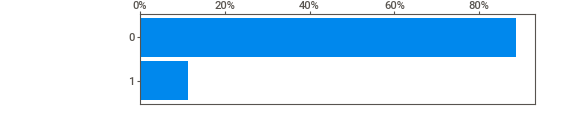
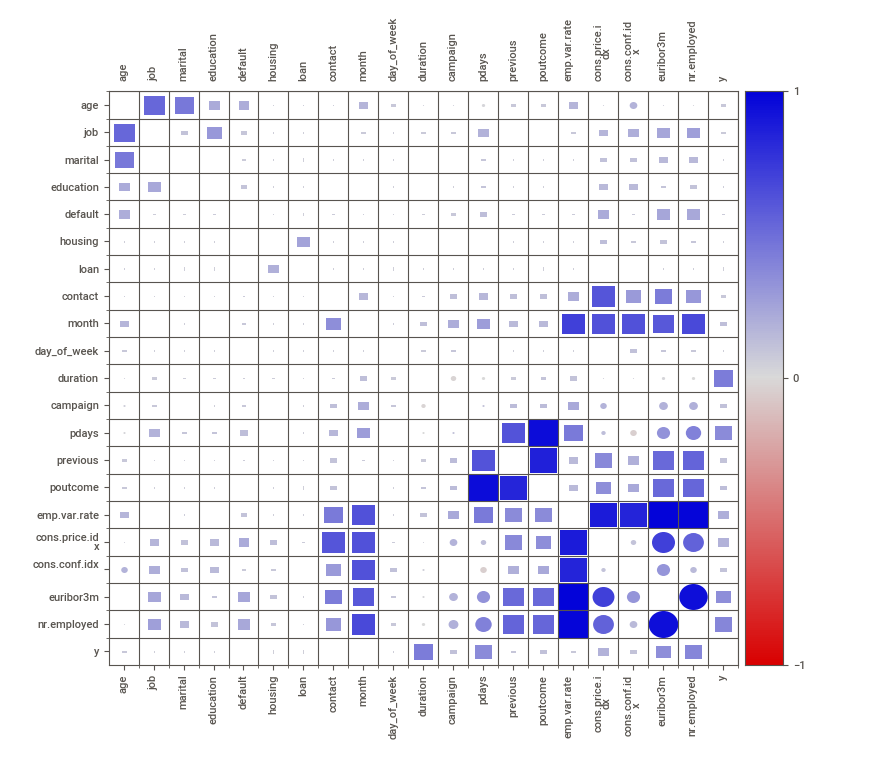
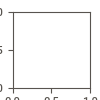

In [ ]:
df_report=sv.analyze(df)
df_report.show_notebook()

Features


*   Duration
*   nr.employed
*   euribor3m
*   cons.price.idx
*   campaign
*   cons.conf.idx
*   age



Create a model using these features, first with duratio and second without it and see how it comes out.

In [ ]:
X=df[['age','duration','euribor3m','cons.price.idx','campaign','cons.conf.idx']]
Y= df['y']

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
train_X,test_X, train_Y,test_Y=train_test_split(X,Y,train_size=0.7,random_state=123)

In [ ]:
print("train data: ",train_X.shape)
print("test data: ", test_X.shape)

train data:  (28831, 6)
test data:  (12357, 6)


In [ ]:
#algorithm
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score

In [ ]:
# dealing with the imbalanced class using a hybrid approach of undersampling and oversampling
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

model1 = LogisticRegression()
over = SMOTE(sampling_strategy=0.4)
under = RandomUnderSampler(sampling_strategy=0.5)
steps = [('o', over), ('u', under), ('model1', model1)]
pipeline = Pipeline(steps=steps)

In [ ]:
#evaluation
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc

pipeline.fit(train_X,train_Y)
log=pipeline.predict(test_X)

In [ ]:
from numpy import mean
scores = cross_val_score(pipeline, train_X, train_Y, scoring='roc_auc', cv=5, n_jobs=-1)
score = mean(scores)
print("Score for the combined sampling method: %.3f" % score)

Score for the combined sampling method: 0.911


In [ ]:
#next model
model2 = DecisionTreeClassifier()
over = SMOTE(sampling_strategy=0.4)
under = RandomUnderSampler(sampling_strategy=0.5)
steps = [('o', over), ('u', under), ('model2', model2)]
pipeline2 = Pipeline(steps=steps)

In [ ]:
pipeline2.fit(train_X,train_Y)
decision=pipeline2.predict(test_X)

In [ ]:
scores = cross_val_score(pipeline2, train_X, train_Y, scoring='roc_auc', cv=5, n_jobs=-1)
score = mean(scores)
print("Score for the decision tree classifier model: %.3f" % score)

Score for the decision tree classifier model: 0.748


In [ ]:
model3 = SVC()
over = SMOTE(sampling_strategy=0.4)
under = RandomUnderSampler(sampling_strategy=0.5)
steps = [('o', over), ('u', under), ('model3', model3)]
pipeline3 = Pipeline(steps=steps)

In [ ]:
pipeline3.fit(train_X, train_Y)
svc=pipeline3.predict(test_X)

In [ ]:
scores = cross_val_score(pipeline3, train_X, train_Y, scoring='roc_auc', cv=5, n_jobs=-1)
score = mean(scores)
print("Score for the SVC model: %.3f" % score)

/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:705: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning


Score for the SVC model: 0.874


In [ ]:
model4=RandomForestClassifier()
over =SMOTE(sampling_strategy=0.4)
under=RandomUnderSampler(sampling_strategy=0.5)
steps=[('o',over),('u',under),('model4',model4)]
pipeline4=Pipeline(steps=steps)

In [ ]:
pipeline4.fit(train_X,train_Y)
random=pipeline4.predict(test_X)


In [ ]:
scores = cross_val_score(pipeline4, train_X, train_Y, scoring='roc_auc', cv=5, n_jobs=-1)
score = mean(scores)
print("Score for the SVC model: %.3f" % score)

Score for the SVC model: 0.937


In [ ]:
#Confusion matrix testing on the test_data
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import plot_confusion_matrix

In [ ]:
#logistic regression
print('Accuracy Score is {:.5}'.format(accuracy_score(test_Y, log)))
print(pd.DataFrame(confusion_matrix(test_Y, log)))

sns.set_style('white') 
class_names = ['0','1']

Accuracy Score is 0.87359
      0     1
0  9767  1194
1   368  1028


In [ ]:
#decion tree classifier
print('Accuracy Score is {:.5}'.format(accuracy_score(test_Y, decision)))
print(pd.DataFrame(confusion_matrix(test_Y, decision)))

sns.set_style('white') 
class_names = ['0','1']

Accuracy Score is 0.88112
       0    1
0  10090  871
1    598  798


In [ ]:
#SVM
print('Accuracy Score is {:.5}'.format(accuracy_score(test_Y, svc)))
print(pd.DataFrame(confusion_matrix(test_Y,svc)))

sns.set_style('white') 
class_names = ['0','1']

Accuracy Score is 0.86866
       0    1
0  10029  932
1    691  705


In [ ]:
# random forest classifier
print('Accuracy Score is {:.5}'.format(accuracy_score(test_Y, random)))
print(pd.DataFrame(confusion_matrix(test_Y, random)))

sns.set_style('white') 
class_names = ['0','1']

Accuracy Score is 0.89949
       0    1
0  10203  758
1    484  912
